# Testing on only 2012 Data 
## Baseline Ordinary MLR 

# Ordinary/Weighted Multiple Linear Regression, XGBoost

### Response variables considered 
- Proportion of a geographic unit (precinct, district, etc.) that voted R in the 2012 and 2016 presidential elections (we examine only D since the proportion voting R is just 1 - proportion voting D)
- For the purposes of this project, we ignore 3rd parties and do not count them towards overall proportions

### Training test split
- Train on 80% of the data and test on the remaining 20%

### Regression techniques tested in this notebook 
- Ordinary Multiple Linear Regression
- XGBoost 

### Goals
- Discover which parameters most contribute towards voting D or R
- What regions tend to vote D or R

In [143]:
# loading libraries
import matplotlib.pyplot as plt
import json, math, random, shapely, shapefile, plotly, geopandas
from gerrychain import Graph, Partition, Election
from gerrychain.updaters import Tally, cut_edges
import seaborn as sns
import pandas as pd
import plotly.plotly as py
import plotly.figure_factory as ff
import numpy as np
from matplotlib.pyplot import figure
from scipy.spatial import ConvexHull
from shapely.geometry import Polygon
from plotly.offline import init_notebook_mode, plot
init_notebook_mode()

from sklearn.decomposition import PCA
from sklearn import decomposition

from sklearn.preprocessing import StandardScaler

from regression_utils import *

from sklearn import linear_model
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from sklearn import linear_model
import xgboost as xgb
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from feature_selector import FeatureSelector
from matplotlib.colors import LinearSegmentedColormap
from sklearn.metrics import r2_score

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RandomizedSearchCV


In [113]:
def format_PA_data_geo(geo_df_PA, prop = False): 
    geo_df_PA_info = geo_df_PA.dissolve(by='COUNTYFP10', aggfunc='sum')

    data_df = geo_df_PA_info[['geometry','NH_WHITE', 'NH_BLACK', 'NH_AMIN',
       'NH_ASIAN', 'NH_NHPI', 'NH_OTHER', 'NH_2MORE', 'HISP', 'H_WHITE',
       'H_BLACK', 'H_AMIN', 'H_ASIAN', 'H_NHPI', 'H_OTHER', 'H_2MORE',
       'HVAP', 'WVAP', 'BVAP', 'AMINVAP', 'ASIANVAP', 'NHPIVAP', 'OTHERVAP',
       '2MOREVAP']]

    if prop: 
        totpop_lst = ['NH_WHITE', 'NH_BLACK', 'NH_AMIN',
        'NH_ASIAN', 'NH_NHPI', 'NH_OTHER', 'NH_2MORE', 'HISP', 'H_WHITE',
        'H_BLACK', 'H_AMIN', 'H_ASIAN', 'H_NHPI', 'H_OTHER', 'H_2MORE']

        for feature in totpop_lst: 
            data_df[feature] = geo_df_PA_info[feature] / geo_df_PA_info['TOTPOP']

        vap_lst = ['HVAP', 'WVAP', 'BVAP', 'AMINVAP', 'ASIANVAP', 'NHPIVAP', 'OTHERVAP',
            '2MOREVAP']
        for feature in vap_lst: 
            data_df[feature] = geo_df_PA_info[feature] / geo_df_PA_info['VAP']


    data_df['PRES12D_prop'] = geo_df_PA_info['PRES12D'] / (geo_df_PA_info['PRES12D'] + geo_df_PA_info['PRES12R'])
    data_df['PRES12R_prop'] = geo_df_PA_info['PRES12R'] / (geo_df_PA_info['PRES12D'] + geo_df_PA_info['PRES12R'])


    data_df['T16PRESD_prop'] = geo_df_PA_info['T16PRESD'] / (geo_df_PA_info['T16PRESD'] + geo_df_PA_info['T16PRESR'])
    data_df['T16PRESR_prop'] = geo_df_PA_info['T16PRESR'] / (geo_df_PA_info['T16PRESD'] + geo_df_PA_info['T16PRESR'])

    return data_df

In [3]:
geo_df_PA_ = geopandas.read_file("PA_data/PA.shp")

In [4]:
geo_df_PA = geo_df_PA_

Dataframe with raw population data 

In [5]:
data_df_no_prop = format_PA_data_geo(geo_df_PA, prop = False)
data_df_no_prop

,geometry,NH_WHITE,NH_BLACK,NH_AMIN,NH_ASIAN,NH_NHPI,NH_OTHER,NH_2MORE,HISP,H_WHITE,...,BVAP,AMINVAP,ASIANVAP,NHPIVAP,OTHERVAP,2MOREVAP,PRES12D_prop,PRES12R_prop,T16PRESD_prop,T16PRESR_prop
COUNTYFP10,,,,,,,,,,,,,,,,,,,,,
001,"POLYGON ((328976.387 4410953.882, 328973.172 4...",91835,1450,146,737,20,79,1030,6115,3149,...,1064,114,565,14,41,472,0.360523,0.639477,0.311733,0.688267
003,"POLYGON ((88114.160 4462136.864, 88111.807 446...",986212,159998,1426,33944,251,2098,20349,19070,11083,...,115179,1130,27016,195,1065,9563,0.572543,0.427457,0.584383,0.415617
005,"POLYGON ((126403.144 4500197.875, 126401.801 4...",67326,540,41,147,8,25,488,366,239,...,399,35,104,5,10,213,0.314254,0.685746,0.234229,0.765771
007,"POLYGON ((59293.111 4506095.726, 59279.292 450...",154196,10586,158,717,32,141,2711,1998,1365,...,7561,122,517,19,51,1021,0.462754,0.537246,0.399401,0.600599
009,"POLYGON ((215316.264 4409685.647, 215306.646 4...",48535,236,57,101,5,24,354,450,247,...,179,45,78,5,13,180,0.222157,0.777843,0.157036,0.842964
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,"POLYGON ((87032.499 4448287.945, 86958.234 444...",194171,6650,214,1313,28,178,2900,2366,1486,...,5120,173,952,25,68,1246,0.430974,0.569026,0.371740,0.628260
127,"POLYGON ((457639.260 4564788.257, 457642.874 4...",48590,1563,85,252,3,32,481,1816,1169,...,1445,77,213,3,28,265,0.394327,0.605673,0.301394,0.698606
129,"POLYGON ((139471.542 4447192.020, 139397.099 4...",346111,8425,305,2692,59,242,4156,3179,2071,...,6201,242,1953,46,96,1661,0.380189,0.619811,0.338598,0.661402


Dataframe with population proportions instead 

In [6]:
data_df = format_PA_data_geo(geo_df_PA, prop = True)
data_df

,geometry,NH_WHITE,NH_BLACK,NH_AMIN,NH_ASIAN,NH_NHPI,NH_OTHER,NH_2MORE,HISP,H_WHITE,...,BVAP,AMINVAP,ASIANVAP,NHPIVAP,OTHERVAP,2MOREVAP,PRES12D_prop,PRES12R_prop,T16PRESD_prop,T16PRESR_prop
COUNTYFP10,,,,,,,,,,,,,,,,,,,,,
001,"POLYGON ((328976.387 4410953.882, 328973.172 4...",0.905563,0.014298,0.001440,0.007267,0.000197,0.000779,0.010157,0.060299,0.031052,...,0.013473,0.001444,0.007154,0.000177,0.000519,0.005977,0.360523,0.639477,0.311733,0.688267
003,"POLYGON ((88114.160 4462136.864, 88111.807 446...",0.806158,0.130787,0.001166,0.027747,0.000205,0.001715,0.016634,0.015588,0.009060,...,0.117328,0.001151,0.027520,0.000199,0.001085,0.009741,0.572543,0.427457,0.584383,0.415617
005,"POLYGON ((126403.144 4500197.875, 126401.801 4...",0.976574,0.007833,0.000595,0.002132,0.000116,0.000363,0.007079,0.005309,0.003467,...,0.007287,0.000639,0.001899,0.000091,0.000183,0.003890,0.314254,0.685746,0.234229,0.765771
007,"POLYGON ((59293.111 4506095.726, 59279.292 450...",0.904169,0.062074,0.000926,0.004204,0.000188,0.000827,0.015897,0.011716,0.008004,...,0.055735,0.000899,0.003811,0.000140,0.000376,0.007526,0.462754,0.537246,0.399401,0.600599
009,"POLYGON ((215316.264 4409685.647, 215306.646 4...",0.975343,0.004743,0.001145,0.002030,0.000100,0.000482,0.007114,0.009043,0.004964,...,0.004587,0.001153,0.001999,0.000128,0.000333,0.004613,0.222157,0.777843,0.157036,0.842964
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,"POLYGON ((87032.499 4448287.945, 86958.234 444...",0.934323,0.031999,0.001030,0.006318,0.000135,0.000857,0.013954,0.011385,0.007150,...,0.031005,0.001048,0.005765,0.000151,0.000412,0.007545,0.430974,0.569026,0.371740,0.628260
127,"POLYGON ((457639.260 4564788.257, 457642.874 4...",0.919882,0.029590,0.001609,0.004771,0.000057,0.000606,0.009106,0.034380,0.022131,...,0.033777,0.001800,0.004979,0.000070,0.000655,0.006194,0.394327,0.605673,0.301394,0.698606
129,"POLYGON ((139471.542 4447192.020, 139397.099 4...",0.947810,0.023072,0.000835,0.007372,0.000162,0.000663,0.011381,0.008706,0.005671,...,0.021196,0.000827,0.006676,0.000157,0.000328,0.005678,0.380189,0.619811,0.338598,0.661402


In [9]:
viz_df = data_df
viz_df['2012_party'] = np.where(data_df['PRES12R_prop'] > .5, 0, 1) # 0 is R, 1 is D
viz_df['2016_party'] = np.where(data_df['T16PRESR_prop'] > .5, 0, 1) 

In [10]:
viz_df.head()

,geometry,NH_WHITE,NH_BLACK,NH_AMIN,NH_ASIAN,NH_NHPI,NH_OTHER,NH_2MORE,HISP,H_WHITE,...,ASIANVAP,NHPIVAP,OTHERVAP,2MOREVAP,PRES12D_prop,PRES12R_prop,T16PRESD_prop,T16PRESR_prop,2012_party,2016_party
COUNTYFP10,,,,,,,,,,,,,,,,,,,,,
001,"POLYGON ((328976.387 4410953.882, 328973.172 4...",0.905563,0.014298,0.001440,0.007267,0.000197,0.000779,0.010157,0.060299,0.031052,...,0.007154,0.000177,0.000519,0.005977,0.360523,0.639477,0.311733,0.688267,0,0
003,"POLYGON ((88114.160 4462136.864, 88111.807 446...",0.806158,0.130787,0.001166,0.027747,0.000205,0.001715,0.016634,0.015588,0.009060,...,0.027520,0.000199,0.001085,0.009741,0.572543,0.427457,0.584383,0.415617,1,1
005,"POLYGON ((126403.144 4500197.875, 126401.801 4...",0.976574,0.007833,0.000595,0.002132,0.000116,0.000363,0.007079,0.005309,0.003467,...,0.001899,0.000091,0.000183,0.003890,0.314254,0.685746,0.234229,0.765771,0,0
007,"POLYGON ((59293.111 4506095.726, 59279.292 450...",0.904169,0.062074,0.000926,0.004204,0.000188,0.000827,0.015897,0.011716,0.008004,...,0.003811,0.000140,0.000376,0.007526,0.462754,0.537246,0.399401,0.600599,0,0
009,"POLYGON ((215316.264 4409685.647, 215306.646 4...",0.975343,0.004743,0.001145,0.002030,0.000100,0.000482,0.007114,0.009043,0.004964,...,0.001999,0.000128,0.000333,0.004613,0.222157,0.777843,0.157036,0.842964,0,0


In [100]:
mycmap = LinearSegmentedColormap.from_list(
    'mycmap', [(0, 'red'), (1, 'blue')])

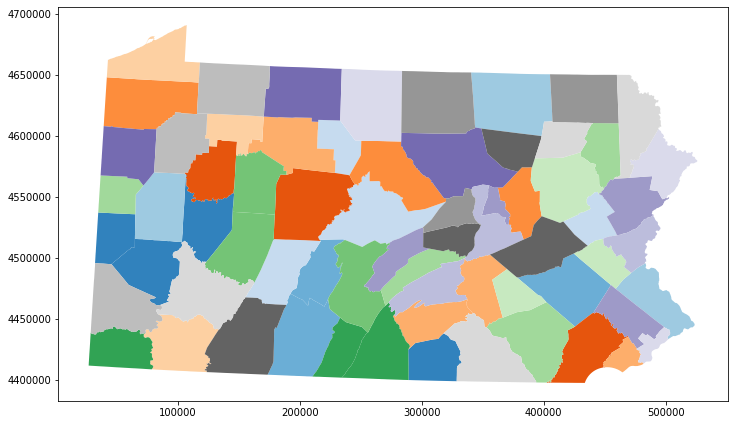

In [102]:
viz_df.plot(cmap='tab20c',figsize=(12,8))

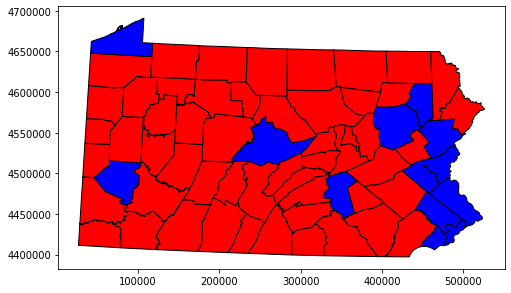

In [112]:
viz_df.plot(column = '2012_party', cmap=mycmap,edgecolor='Black', figsize=(8,6))

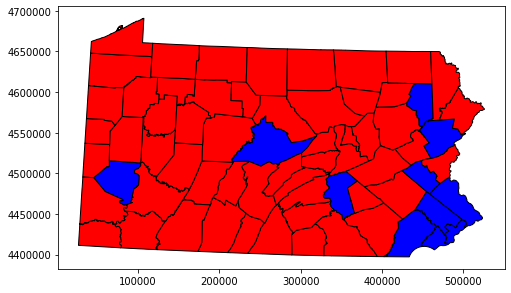

In [110]:
viz_df.plot(column = '2016_party', cmap=mycmap,edgecolor='Black', figsize=(8,6))

# Ordinary MLR

In [205]:
def calculate_OLS_MLR(df, target, X_vals=None): 

    if X_vals != None: 
        X = df[X_vals]
    else:   
        X = df[['NH_WHITE', 'NH_BLACK', 'NH_AMIN',
            'NH_ASIAN', 'NH_NHPI', 'NH_OTHER', 'NH_2MORE', 'HISP', 'H_WHITE',
            'H_BLACK', 'H_AMIN', 'H_ASIAN', 'H_NHPI', 'H_OTHER', 'H_2MORE',
            'HVAP', 'WVAP', 'BVAP', 'AMINVAP', 'ASIANVAP', 'NHPIVAP', 'OTHERVAP',
            '2MOREVAP']]

    y = df[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25)
    model = sm.OLS(y_train, X_train).fit()
    predictions = model.predict(X_test)

    rmse = mean_squared_error(y_test,predictions,squared=False) 
    rsq = r2_score(y_test, predictions)   
    # print('rsq is', rsq)
    adj_rsq = 1-(1-r2_score(y_test, predictions))*((len(X_test)-1)/(len(X_test)-(X_test.shape[0]-1)))

    params = model.params 
    return rmse, rsq, adj_rsq, params

## Non-Proportions Dataset 

Here we train and test on the raw data of the voter tabulation counts (the response variable is still a proportion though)

In [151]:
X = data_df_no_prop[['NH_WHITE', 'NH_BLACK', 'NH_AMIN',
       'NH_ASIAN', 'NH_NHPI', 'NH_OTHER', 'NH_2MORE', 'HISP', 'H_WHITE',
       'H_BLACK', 'H_AMIN', 'H_ASIAN', 'H_NHPI', 'H_OTHER', 'H_2MORE',
       'HVAP', 'WVAP', 'BVAP', 'AMINVAP', 'ASIANVAP', 'NHPIVAP', 'OTHERVAP',
       '2MOREVAP']]

y = data_df_no_prop['PRES12D_prop']

In [152]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

In [153]:
model = sm.OLS(y_train, X_train).fit()
predictions = model.predict(X_test)
print_model = model.summary()
print(print_model)


                                 OLS Regression Results                                
Dep. Variable:           PRES12D_prop   R-squared (uncentered):                   0.901
Model:                            OLS   Adj. R-squared (uncentered):              0.830
Method:                 Least Squares   F-statistic:                              12.80
Date:                Fri, 04 Dec 2020   Prob (F-statistic):                    4.38e-10
Time:                        00:34:56   Log-Likelihood:                          30.297
No. Observations:                  53   AIC:                                     -16.59
Df Residuals:                      31   BIC:                                      26.75
Df Model:                          22                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [154]:
mean_squared_error(y_test,predictions,squared=False)

0.6275489754136583

## Proportions Dataset 

Here we train and test on the proportions of the voter tabulation counts

In [206]:
X = data_df[['NH_WHITE', 'NH_BLACK', 'NH_AMIN',
       'NH_ASIAN', 'NH_NHPI', 'NH_OTHER', 'NH_2MORE', 'HISP', 'H_WHITE',
       'H_BLACK', 'H_AMIN', 'H_ASIAN', 'H_NHPI', 'H_OTHER', 'H_2MORE',
       'HVAP', 'WVAP', 'BVAP', 'AMINVAP', 'ASIANVAP', 'NHPIVAP', 'OTHERVAP',
       '2MOREVAP']]

y = data_df['PRES12D_prop']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

model = sm.OLS(y_train, X_train).fit()
predictions = model.predict(X_test)
print_model = model.summary()
print(print_model)


                            OLS Regression Results                            
Dep. Variable:           PRES12D_prop   R-squared:                       0.789
Model:                            OLS   Adj. R-squared:                  0.657
Method:                 Least Squares   F-statistic:                     5.982
Date:                Fri, 04 Dec 2020   Prob (F-statistic):           4.34e-06
Time:                        00:59:53   Log-Likelihood:                 82.498
No. Observations:                  53   AIC:                            -123.0
Df Residuals:                      32   BIC:                            -81.62
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
NH_WHITE     -11.4353     74.305     -0.154      0.8

In [207]:
mean_squared_error(y_test,predictions,squared=False)

0.11413936491438831

In [208]:
r2_score(y_test, predictions)

-0.4440428233556504

In [212]:
avg_rmse = 0 
avg_rsq = 0
avg_adj_rsq = 0
n = 5000


for _ in range(1): 
    rmse, rsq, adj_rsq, params  = calculate_OLS_MLR(data_df_no_prop,'PRES12D_prop')
    avg_rmse += rmse 
    avg_rsq += rsq 
    avg_adj_rsq += adj_rsq

    avg_params = params

for _ in range(n-1): 
    # print('cat')
    rmse, rsq, adj_rsq, params  = calculate_OLS_MLR(data_df_no_prop,'PRES12D_prop')
    avg_rmse += rmse 
    avg_rsq += rsq 
    avg_adj_rsq += adj_rsq

    avg_params += params

avg_rmse/n, avg_rsq/n, avg_adj_rsq/n, avg_params / n

(1.02576393583211,
 -141.63449028657996,
 -2281.151844585278,
 NH_WHITE   -0.000035
 NH_BLACK    0.000025
 NH_AMIN    -0.000660
 NH_ASIAN    0.000191
 NH_NHPI    -0.005486
 NH_OTHER   -0.002887
 NH_2MORE   -0.000416
 HISP        0.002665
 H_WHITE    -0.002546
 H_BLACK    -0.002089
 H_AMIN     -0.004717
 H_ASIAN    -0.001181
 H_NHPI      0.019723
 H_OTHER    -0.002680
 H_2MORE    -0.003846
 HVAP        0.000014
 WVAP        0.000048
 BVAP       -0.000039
 AMINVAP     0.004259
 ASIANVAP   -0.000276
 NHPIVAP    -0.000480
 OTHERVAP    0.002125
 2MOREVAP    0.000788
 dtype: float64)

In [210]:
avg_rmse = 0 
avg_rsq = 0
avg_adj_rsq = 0
n = 5000


for _ in range(1): 
    rmse, rsq, adj_rsq, params  = calculate_OLS_MLR(data_df,'PRES12D_prop')
    avg_rmse += rmse 
    avg_rsq += rsq 
    avg_adj_rsq += adj_rsq

    avg_params = params

for _ in range(n-1): 
    # print('cat')
    rmse, rsq, adj_rsq, params  = calculate_OLS_MLR(data_df,'PRES12D_prop')
    avg_rmse += rmse 
    avg_rsq += rsq 
    avg_adj_rsq += adj_rsq

    avg_params += params

avg_rmse/n, avg_rsq/n, avg_adj_rsq/n, avg_params / n

(0.09729278249114667,
 -0.0455503005929902,
 -15.728804809487826,
 NH_WHITE    -36.255158
 NH_BLACK    -32.726035
 NH_AMIN      81.442796
 NH_ASIAN    -48.614904
 NH_NHPI     193.873220
 NH_OTHER     20.979074
 NH_2MORE    -32.254210
 HISP        -43.528664
 H_WHITE       8.704141
 H_BLACK      -6.185224
 H_AMIN       -3.545424
 H_ASIAN     287.844759
 H_NHPI     -341.007671
 H_OTHER       9.394256
 H_2MORE       1.266499
 HVAP         36.318801
 WVAP         36.543086
 BVAP         33.625839
 AMINVAP     -71.044074
 ASIANVAP     50.291002
 NHPIVAP     -17.747844
 OTHERVAP      4.228060
 2MOREVAP     30.701249
 dtype: float64)

In [123]:
avg_rmse = 0
n = 10000
for _ in range(n): 
    avg_rmse  += calculate_OLS_MLR(data_df,"PRES12D_prop")

avg_rmse/n

0.0974783520161032

## Analyzing correlation and performing feature selection 

In [213]:
X = data_df[['NH_WHITE', 'NH_BLACK', 'NH_AMIN',
       'NH_ASIAN', 'NH_NHPI', 'NH_OTHER', 'NH_2MORE', 'HISP', 'H_WHITE',
       'H_BLACK', 'H_AMIN', 'H_ASIAN', 'H_NHPI', 'H_OTHER', 'H_2MORE',
       'HVAP', 'WVAP', 'BVAP', 'AMINVAP', 'ASIANVAP', 'NHPIVAP', 'OTHERVAP',
       '2MOREVAP']]

y = data_df['PRES12D_prop']

13 features with a correlation magnitude greater than 0.90.



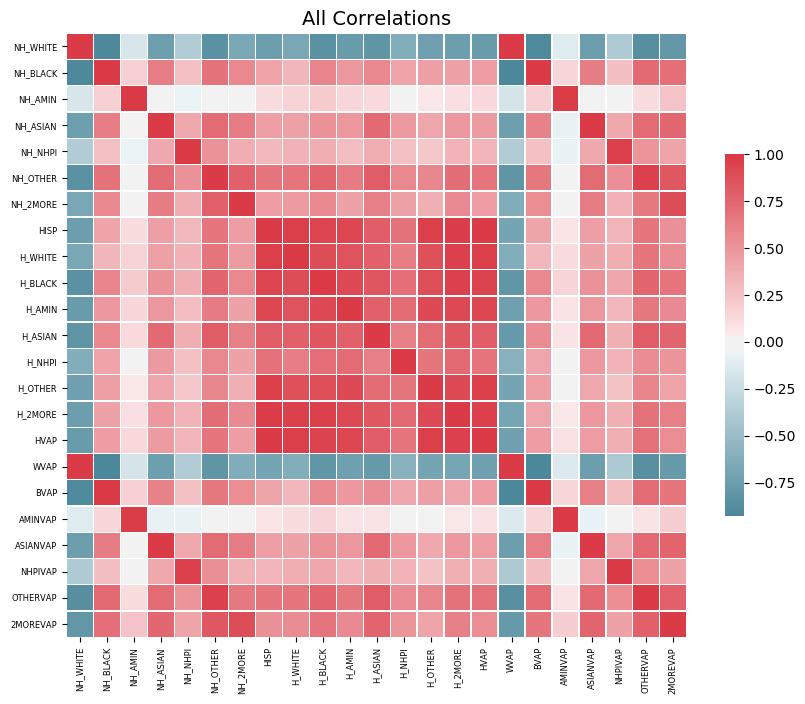

In [214]:
fs = FeatureSelector(data = X, labels = y )
fs.identify_collinear(correlation_threshold = 0.9)
fs.plot_collinear( plot_all = True)

In [215]:
fs.identify_zero_importance(task = 'regression',
 eval_metric = 'l2_root', #l2_root = RMSE, root mean squared error
 n_iterations = 100,
 early_stopping = False)

Training Gradient Boosting Model


0 features with zero importance after one-hot encoding.



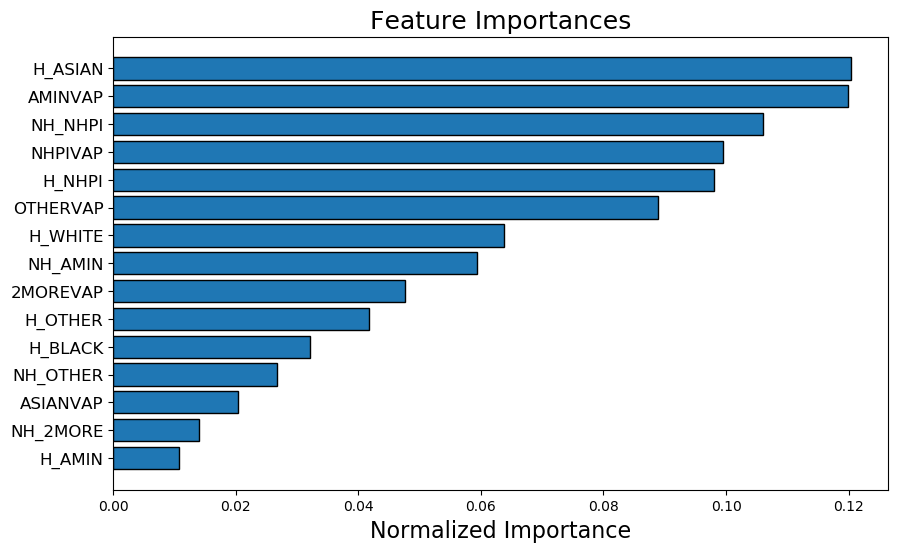

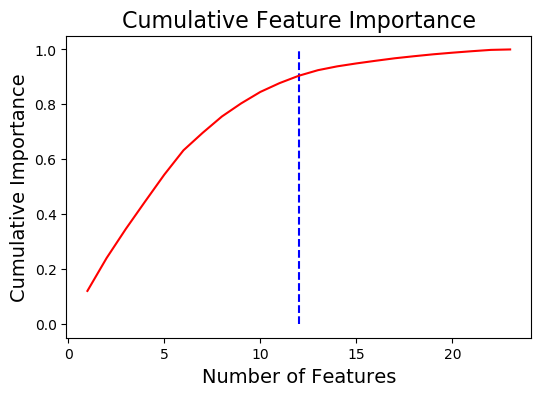

12 features required for 0.90 of cumulative importance


In [216]:
zero_importance_features = fs.ops['zero_importance']
fs.plot_feature_importances(threshold = 0.9)

In [217]:
# X = data_df[['NH_WHITE', 'NH_BLACK', 'NH_AMIN',
#        'NH_ASIAN', 'NH_NHPI', 'NH_OTHER', 'NH_2MORE', 'HISP', 'H_WHITE',
#        'H_BLACK', 'H_AMIN', 'H_ASIAN', 'H_NHPI', 'H_OTHER', 'H_2MORE',
#        'HVAP', 'WVAP', 'BVAP', 'AMINVAP', 'ASIANVAP', 'NHPIVAP', 'OTHERVAP',
#        '2MOREVAP']]

to_keep = ['H_ASIAN', 'AMINVAP','NH_NHPI','NHPIVAP', 'H_NHPI','OTHERVAP','H_WHITE','NH_AMIN',
               '2MOREVAP', 'H_OTHER','H_BLACK','NH_OTHER', 'ASIANVAP','NH_2MORE','H_AMIN']

X = data_df[to_keep]

y = data_df['PRES12D_prop']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

model = sm.OLS(y_train, X_train).fit()
predictions = model.predict(X_test)
print_model = model.summary()
print(print_model)


                                 OLS Regression Results                                
Dep. Variable:           PRES12D_prop   R-squared (uncentered):                   0.974
Model:                            OLS   Adj. R-squared (uncentered):              0.964
Method:                 Least Squares   F-statistic:                              95.98
Date:                Fri, 04 Dec 2020   Prob (F-statistic):                    1.83e-25
Time:                        01:16:52   Log-Likelihood:                          66.068
No. Observations:                  53   AIC:                                     -102.1
Df Residuals:                      38   BIC:                                     -72.58
Df Model:                          15                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [218]:
mean_squared_error(y_test,predictions,squared=False)

0.085884146169492

In [228]:
avg_rmse = 0
n = 1000
for _ in range(n): 
    rmse, r2, adj_rsq, params  = calculate_OLS_MLR(data_df,"PRES12D_prop")
    avg_rmse += rmse
avg_rmse/n

0.09679152693327454

In [221]:
avg_rmse = 0
n = 1000
for _ in range(n): 
    rmse, r2, adj_rsq, params  = calculate_OLS_MLR(data_df_no_prop,"PRES12D_prop",X_vals=to_keep)
    avg_rmse += rmse
avg_rmse/n

0.7923944716158408

In [224]:
to_keep

['H_ASIAN',
 'AMINVAP',
 'NH_NHPI',
 'NHPIVAP',
 'H_NHPI',
 'OTHERVAP',
 'H_WHITE',
 'NH_AMIN',
 '2MOREVAP',
 'H_OTHER',
 'H_BLACK',
 'NH_OTHER',
 'ASIANVAP',
 'NH_2MORE',
 'H_AMIN']

In [223]:
avg_rmse = 0
n = 1000
for _ in range(n): 
    rmse, r2, adj_rsq, params  = calculate_OLS_MLR(data_df,"PRES12D_prop",X_vals=to_keep)
    avg_rmse += rmse
avg_rmse/n

0.09793683917644967

# XGBoost

In [234]:
X = data_df[['NH_WHITE', 'NH_BLACK', 'NH_AMIN',
       'NH_ASIAN', 'NH_NHPI', 'NH_OTHER', 'NH_2MORE', 'HISP', 'H_WHITE',
       'H_BLACK', 'H_AMIN', 'H_ASIAN', 'H_NHPI', 'H_OTHER', 'H_2MORE',
       'HVAP', 'WVAP', 'BVAP', 'AMINVAP', 'ASIANVAP', 'NHPIVAP', 'OTHERVAP',
       '2MOREVAP']]

y = data_df['PRES12D_prop']

In [235]:
data_dmatrix = xgb.DMatrix(data=X,label=y)

In [236]:
model = xgb.XGBRegressor(objective ='reg:squarederror')


parameters = {
                "learning_rate":  [.001,.01,.1],
               "max_depth": [3, 5,7],
               "colsample_bytree": [0.2,0.3, 0.4],
               "reg_alpha": [3,5,10], 
               "reg_lambda": [3,5,10] }
grid_result = GridSearchCV(model, parameters, cv = 4,scoring='neg_root_mean_squared_error')

grid_result.fit(X,y)

GridSearchCV(cv=4, error_score=nan,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, gamma=None,
                                    gpu_id=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estima...
                                    subsample=None, tree_method=None,
                                    validate_parameters=None, verbosity=None),
             iid='deprecated', n_jobs=None,
             param_grid={'colsample_bytree': [0.2, 0.3, 0.4],
                         'learning_ra

In [237]:
print("Best RMSE {} using {}".format(grid_result.best_score_, grid_result.best_params_))

Best RMSE -0.10810692900710883 using {'colsample_bytree': 0.3, 'learning_rate': 0.1, 'max_depth': 5, 'reg_alpha': 3, 'reg_lambda': 3}


In [238]:
params = {'colsample_bytree': 0.3, 'learning_rate': 0.1, 'max_depth': 5, 'reg_alpha': 3, 'reg_lambda': 3}

cv_results = xgb.cv(dtrain=data_dmatrix, params=params, nfold=10,
                    num_boost_round=100,metrics="rmse", as_pandas=True, seed=412)

cv_results

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
0,0.135275,0.002558,0.133255,0.022088
1,0.131541,0.002425,0.129877,0.022096
2,0.128124,0.002337,0.126806,0.022063
3,0.125160,0.002253,0.124193,0.022070
4,0.122468,0.002301,0.121830,0.021965
...,...,...,...,...
95,0.097380,0.003043,0.100533,0.021996
96,0.097380,0.003043,0.100533,0.021996
97,0.097380,0.003043,0.100533,0.021996
98,0.097379,0.003043,0.100531,0.021995


Text(0.5, 1.0, 'RMSE vs. Boosting Round Number')

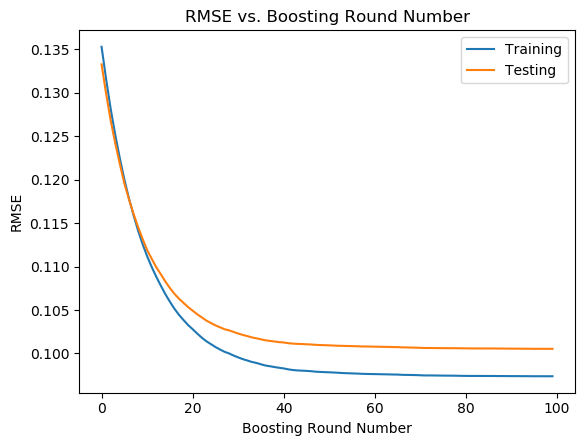

In [240]:
plt.plot(cv_results.values[:,0])
plt.plot(cv_results.values[:,2])
plt.legend(['Training','Testing'])
plt.xlabel('Boosting Round Number')
plt.ylabel('RMSE')
plt.title('RMSE vs. Boosting Round Number')
# plt.ylim([30, 50])

Fitting best model

## XGBoost with Selected Features

In [244]:
X =  data_df[to_keep]
y = data_df['PRES12D_prop']

In [245]:
data_dmatrix = xgb.DMatrix(data=X,label=y)

In [246]:
model = xgb.XGBRegressor(objective ='reg:squarederror')


parameters = {
                "learning_rate":  [.001,.01,.1],
               "max_depth": [3, 5,7],
               "colsample_bytree": [0.2,0.3, 0.4],
               "reg_alpha": [3,5,10], 
               "reg_lambda": [3,5,10] }
grid_result = GridSearchCV(model, parameters, cv = 4,scoring='neg_root_mean_squared_error')

grid_result.fit(X,y)

GridSearchCV(cv=4, error_score=nan,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, gamma=None,
                                    gpu_id=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estima...
                                    subsample=None, tree_method=None,
                                    validate_parameters=None, verbosity=None),
             iid='deprecated', n_jobs=None,
             param_grid={'colsample_bytree': [0.2, 0.3, 0.4],
                         'learning_ra

In [247]:
print("Best RMSE {} using {}".format(grid_result.best_score_, grid_result.best_params_))

Best RMSE -0.10776758540191148 using {'colsample_bytree': 0.2, 'learning_rate': 0.1, 'max_depth': 3, 'reg_alpha': 3, 'reg_lambda': 3}


In [248]:
params = {'colsample_bytree': 0.2, 'learning_rate': 0.1, 'max_depth': 3, 'reg_alpha': 3, 'reg_lambda': 3}

cv_results = xgb.cv(dtrain=data_dmatrix, params=params, nfold=10,
                    num_boost_round=100,metrics="rmse", as_pandas=True, seed=412)

cv_results

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
0,0.135612,0.002564,0.133321,0.022158
1,0.132011,0.002347,0.130110,0.022137
2,0.128977,0.002399,0.127390,0.022089
3,0.126164,0.002271,0.124714,0.022296
4,0.123546,0.002392,0.122081,0.022199
...,...,...,...,...
95,0.098557,0.003085,0.099657,0.022511
96,0.098555,0.003086,0.099658,0.022511
97,0.098538,0.003086,0.099645,0.022514
98,0.098538,0.003086,0.099645,0.022514


Text(0.5, 1.0, 'RMSE vs. Boosting Round Number')

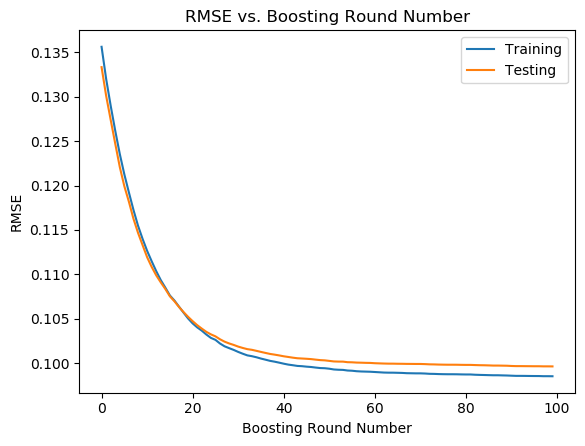

In [249]:
plt.plot(cv_results.values[:,0])
plt.plot(cv_results.values[:,2])
plt.legend(['Training','Testing'])
plt.xlabel('Boosting Round Number')
plt.ylabel('RMSE')
plt.title('RMSE vs. Boosting Round Number')
# plt.ylim([30, 50])